# Neural Networks in PyTorch
## Chapter 4: Training a NN to learn 1D functions
*Yen Lee Loh, 2022-12-8*

In the previous chapters we learned how to construct networks out of layers (including loss functions) and optimize network parameters.  In this chapter, we consider the problem of fitting a dataset $(x_n,y_n)$ with a function $Y(x)$, and how this can be phrased in the language of training a neural network.  We illustrate linear regression, logistic regression, multilayer networks, and the dangers of overfitting.  We demonstrate how to aid the machine by preprocessing (mapping each input vector to a feature vector), and why it is important to normalize the feature values.

---
## 1.  Setup

In [1]:
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import matplotlib.animation
import IPython.display
torch.cuda.is_available()

True

In [2]:
def train(xnd, ynd, model, lossFunc, epochs=10000, learningRate=0.001, tolerance=0.0001, lossTarget=0.01, reportInterval=1000):
  optimizer = torch.optim.Adam(model.parameters(), lr=learningRate)
  model.train()                  # put model in training mode
  F = 1e30
  for t in range(epochs):      # t is the epoch number
    Ynd = model(xnd)             # uppercase Y = model prediction
    loss = lossFunc(Ynd,ynd)
    loss.backward()
    optimizer.step()
    optimizer.zero_grad()
    Fnew=loss.item() ; dF=Fnew-F; F=Fnew 
    if t % reportInterval == 0 or t==epochs:
      print('Training epoch {}/{}  \t Loss = {:.4f}'.format(t, epochs, F))
    if abs(dF) < tolerance:
      print('Training epoch {}/{}  \t Loss = {:.4f}'.format(t, epochs, F))
      print('Change is smaller than tolerance; terminating loop.')
      return
  print ('Warning: tolerance criterion not reached!\n')

def metrics (Yn, yn):   # Yn are model outputs, yn are true outputs
  nmax = len(yn)
  ymax = max(yn)+1
  confmat = np.zeros ([ymax, ymax], dtype=int)   # confmat[Y][y]
  for n in range(nmax): confmat[yn[n], Yn[n]] += 1
  ntot = np.sum(confmat)
  nerr = ntot - np.trace(confmat)
  return ntot,nerr,confmat

def predict(xnd, model):
  return model(xnd).detach()
    
def compare(xnd, ynd, Ynd):
  plt.rcParams.update({'font.size': 14})
  plt.plot(xnd,ynd,'o')
  plt.plot(xnd,Ynd,'x-')
  plt.xlabel('Input $x$'); plt.ylabel('Output $y$')


---
## 2. Linear regression

The simplest type of Generalized Linear Model (GLM) is a Linear Model, in which the mean output is a linear function of the input, and the actual output is normally distributed around the mean output.  Given a set of data points $(x_n,y_n)$, we may fit it with a Linear Model.  We find the straight line that minimizes the sum of squared errors.  This is also called linear regression, the method of least squares, or Ordinary Least Squares (OLS).

We may implement linear regression by constructing a neural network consisting of a linear layer $y = b + wx$ and a mean square error loss function $F = (Y-y)^2$.  This is illustrated below.

In [6]:
#======== Set up data and model
xnd      = torch.tensor([[1,2,3,4,5,6,7,8,9]], dtype=torch.float32).T
ynd      = torch.tensor([[2,1,5,3,4,7,9,6,8]], dtype=torch.float32).T
model    = nn.Linear(1,1)   # 1-input 1-output linear layer including bias
lossFunc = nn.MSELoss()

Training epoch 0/10  	 Loss = 1.8800
Training epoch 1/10  	 Loss = 1.8779
Training epoch 2/10  	 Loss = 1.8765
Training epoch 3/10  	 Loss = 1.8747
Training epoch 4/10  	 Loss = 1.8735
Training epoch 5/10  	 Loss = 1.8724
Training epoch 6/10  	 Loss = 1.8708
Training epoch 7/10  	 Loss = 1.8694
Training epoch 8/10  	 Loss = 1.8683
Training epoch 9/10  	 Loss = 1.8672

Weight w =  0.8077644109725952
Bias   b =  1.025087594985962


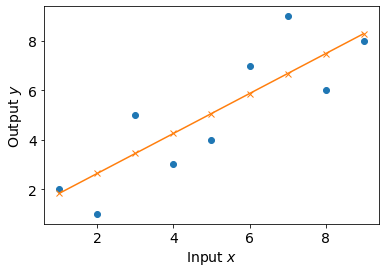

In [28]:
#======== Run this cell many times using Ctrl-Enter
train (xnd, ynd, model, lossFunc, epochs=10, learningRate=0.01, reportInterval=1)
Ynd = predict (xnd, model)
compare (xnd, ynd, Ynd)
print('Weight w = ',model.weight.item())
print('Bias   b = ',model.bias.item())

In [5]:
#======== Animated version of the same thing
xnd      = torch.tensor([[1,2,3,4,5,6,7,8,9]], dtype=torch.float32).T
ynd      = torch.tensor([[2,1,5,3,4,7,9,6,8]], dtype=torch.float32).T
model    = nn.Linear(1,1)   # 1-input 1-output linear layer including bias
lossFunc = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.05)

fig,ax = plt.subplots()
plt.xlabel('Input $x$'); plt.ylabel('Output $y$'); plt.xticks (range(10)); plt.yticks (range(10))
points = ax.plot(xnd,ynd,'o')
line,  = ax.plot(xnd,Ynd,'x-')
plt.close()  # don't show the static figure

def animate(nFrame):
  Ynd = model(xnd)
  loss = lossFunc(Ynd,ynd)
  loss.backward()
  optimizer.step()
  optimizer.zero_grad()
  Yn = Ynd.detach().flatten()
  line.set_ydata (Yn)
  return line,
anim = matplotlib.animation.FuncAnimation(fig, animate, interval=20, blit=True) 
IPython.display.HTML(anim.to_jshtml())

---
## 3. Logistic regression

Generalized Linear Model (GLM) ..... tanh mean function ... logistic link function?  output obeys Bernoulli distribution with given mean

logistic regression

We may implement logistic regression by constructing a neural network consisting of a linear layer $u = b + wx$, a tanh layer $y = \tanh(u)$, and a "-1,1" binary cross-entropy loss function $F=\frac{1+y}{2} \ln \frac{2}{1+Y} + \frac{1-y}{2} \ln \frac{2}{1-Y} + ...$. 

Or, ise a sigmoid layer and the  a binary cross-entropy loss function $F=\frac{1+y}{2} \ln \frac{2}{1+Y} + \frac{1-y}{2} \ln \frac{2}{1-Y} + ...$. 
TBD: This is illustrated below.



In [30]:
#======== Set up data and model
xnd      = torch.tensor([[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]], dtype=torch.float32).T
ynd      = torch.tensor([[0,0,0,0,0,1,0,1,1,0,1,1,1,1,1]], dtype=torch.float32).T # * 2 - 1
model    = nn.Sequential (
            nn.Linear(1,1),
            nn.Sigmoid()
          )
lossFunc = nn.BCELoss()

Training epoch 0/10000  	 Loss = 1.5491
Training epoch 100/10000  	 Loss = 0.3386
Training epoch 180/10000  	 Loss = 0.3384
Change is smaller than tolerance; terminating loop.
Weight w =  0.6224998235702515
Bias   b =  -4.662569046020508


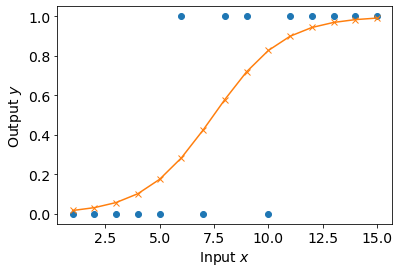

In [31]:
#======== Run this cell many times using Ctrl-Enter
train (xnd, ynd, model, lossFunc, epochs=10000, learningRate=0.2, reportInterval=100, tolerance=1e-9)
Ynd = predict (xnd, model)
compare (xnd, ynd, Ynd)
print('Weight w = ',model[0].weight.item())
print('Bias   b = ',model[0].bias.item())

---
## 4. A more complicated model

Return to our original dataset for linear regression, but this time fit it using a more sophisticated model, $y = b_2 + w_2 \tanh (b_0 + w_0 x)$:

In [35]:
#======== Set up data and model
xnd = torch.tensor([[1,2,3,4,5,6,7,8,9]], dtype=torch.float32).T
ynd = torch.tensor([[2,1,1,3,1,7,9,8,9]], dtype=torch.float32).T
model = nn.Sequential(   # construct model from ready-made building blocks
          nn.Linear(1,1),
          nn.Tanh(),
          nn.Linear(1,1)
        )
lossFunc = nn.MSELoss()

Training epoch 0/100  	 Loss = 22.0323
Training epoch 10/100  	 Loss = 20.7664
Training epoch 20/100  	 Loss = 19.5993
Training epoch 30/100  	 Loss = 18.5361
Training epoch 40/100  	 Loss = 17.5759
Training epoch 50/100  	 Loss = 16.7125
Training epoch 60/100  	 Loss = 15.9320
Training epoch 70/100  	 Loss = 15.2013
Training epoch 80/100  	 Loss = 14.4472
Training epoch 90/100  	 Loss = 13.6956

wI = 0.3939
bI = -0.4387
wO = 1.5880
bO = 1.5253


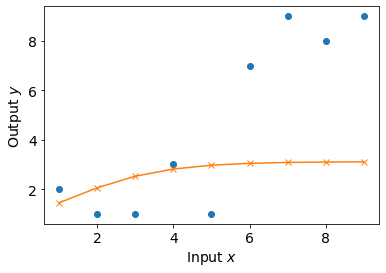

In [36]:
#======== Run this cell many times using Ctrl-Enter
train (xnd, ynd, model, lossFunc, epochs=100, learningRate=0.01, reportInterval=10)
Ynd = predict (xnd, model)
compare (xnd, ynd, Ynd)
print('wI = {:.4f}'.format(model[0].weight.item()))
print('bI = {:.4f}'.format(model[0].bias.item()))
print('wO = {:.4f}'.format(model[2].weight.item()))
print('bO = {:.4f}'.format(model[2].bias.item()))

In [37]:
#======== Animated version of the same thing
xnd = torch.tensor([[1,2,3,4,5,6,7,8,9]], dtype=torch.float32).T
ynd = torch.tensor([[2,1,1,3,1,7,9,8,9]], dtype=torch.float32).T
model = nn.Sequential(   # construct model from ready-made building blocks
          nn.Linear(1,1),
          nn.Tanh(),
          nn.Linear(1,1)
        )
lossFunc = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.05)

fig,ax = plt.subplots()
plt.xlabel('Input $x$'); plt.ylabel('Output $y$'); plt.xticks (range(10)); plt.yticks (range(10))
points = ax.plot(xnd,ynd,'o')
line,  = ax.plot(xnd,Ynd,'x-')
plt.close()  # don't show the static figure

def animate(nFrame):
  Ynd = model(xnd)
  loss = lossFunc(Ynd,ynd)
  loss.backward()
  optimizer.step()
  optimizer.zero_grad()
  Yn = Ynd.detach().flatten()
  line.set_ydata (Yn)
  return line,
anim = matplotlib.animation.FuncAnimation(fig, animate, 400, interval=20, blit=True) 
IPython.display.HTML(anim.to_jshtml())

---
## 5. An overly complex model results in overfitting

Let us take the same data set of 9 points, but try to fit it using a neural network with hundreds of parameters.  Run the cell below.  At first, the network learns well, but later on overfitting begins to occur.

In [12]:
#======== Animated version
xnd = torch.tensor([[1,2,3,4,5,6,7,8,9]], dtype=torch.float32).T
ynd = torch.tensor([[2,1,1,3,1,7,9,8,9]], dtype=torch.float32).T
model = nn.Sequential(   # construct model from ready-made building blocks
          nn.Linear(1,99),
          nn.Tanh(),
          nn.Linear(99,1),
        )
lossFunc = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.25)

fig,ax = plt.subplots()
plt.xlabel('Input $x$'); plt.ylabel('Output $y$'); plt.xticks (range(10)); plt.yticks (range(10))
points = ax.plot(xnd,ynd,'o')
line,  = ax.plot(xnd,Ynd,'x-')
plt.close()  # don't show the static figure

def animate(nFrame):
  Ynd = model(xnd)
  loss = lossFunc(Ynd,ynd)
  loss.backward()
  optimizer.step()
  optimizer.zero_grad()
  Yn = Ynd.detach().flatten()
  line.set_ydata (Yn)
  return line,
anim = matplotlib.animation.FuncAnimation(fig, animate, 400, interval=20, blit=True) 
IPython.display.HTML(anim.to_jshtml())

---
## 5. Exponential growth model

Suppose we want to use a neural network to fit a time series that has exponential growth or decay, using a function of the form $y=\exp (wx+b)$.  PyTorch does not have a built-in layer of the form torch.nn.Exp(), but it does have a function torch.exp(x) that knows how to differentiate itself.  We can construct a custom model by making a class that inherits from torch.nn.Module.  The example below mixes built-in layers with custom operations:

In [38]:
xnd = torch.tensor([[1,2,3,4,5,6,7,8,9]], dtype=torch.float32).T
ynd = torch.tensor([[2,1,5,3,4,7,9,6,8]], dtype=torch.float32).T

class Model(nn.Module):               # construct custom model by subclassing nn.Module
  def __init__(self):
    super(Model, self).__init__()
    self.ll1 = nn.Linear(1,1)         # set up a linear layer
  def forward(self, x):
    return torch.exp(  self.ll1(x) )  # apply linear layer, then apply exp

model = Model()

Training epoch 0/10000  	 Loss = 30.5779
Training epoch 182/10000  	 Loss = 2.1970
Change is smaller than tolerance; terminating loop.


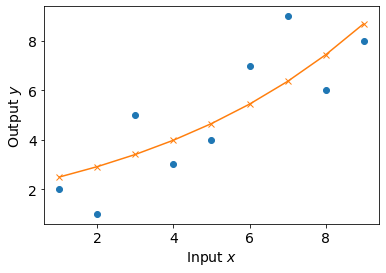

In [39]:
train (xnd, ynd, model, lossFunc, learningRate=0.2, epochs=10000, tolerance=0.000001)  # run this cell many times using Ctrl-Enter
Ynd = predict (xnd, model)
compare (xnd, ynd, Ynd)

---
## 6. Fitting a symmetric sextic

In this section we wish to fit a dataset using a model of the form $y = A + Bx^2 + Cx^4 + Dx^6$.  We explore various ways to do this.  This illustrates concepts such as feature extraction and normalization.

First let's manufacture some fake data:

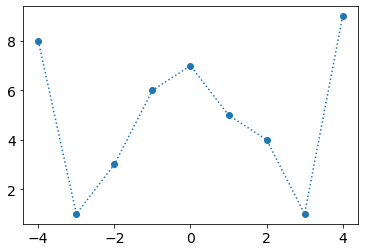

In [22]:
#xnd = torch.tensor([[-4,-3,-2,-1,0,1,2,3,4]], dtype=torch.float32).T
#ynd = 3000 - 400*xnd**2 + 10*xnd**4 + 1*xnd**6   # generate data directly from symmetric sextic!
#ynd = 0.003*(2500 - 400*xnd**2 + 10*xnd**4 + 1*xnd**6)
#torch.set_printoptions(precision=4, threshold=None, edgeitems=None, linewidth=None, profile=None, sci_mode=False)
#print(ynd.T)

xnd = torch.tensor([[-4,-3,-2,-1,0,1,2,3,4]], dtype=torch.float32).T
ynd = torch.tensor([[8,1,3,6,7,5,4,1,9]], dtype=torch.float32).T
plt.plot(xnd,ynd,"o:")

### Attempt 1
Here we implement the model function $y = A + Bx^2 + Cx^4 + Dx^6$ using three steps:
1. Calculate $x^2$, $x^4$, $x^6$.  
2. Feed these through three separate 1x1 linear layers (each with learnable weight and bias).  
3. Add the results to get $y$.

This doesn't work properly.  A learning rate of 1e-6 results in instability, overflow, infinities, and NaNs.  The learning rate must be as small as 1e-7.  The convergence is very slow and the fit is poor.  

I think this is because the model's output is very sensitive to some of the weight parameters, and not sensitive to others.  To avoid instabilities in the sensitive directions in parameter space, the learning rate must be kept to very small values (1e-6), making it inefficient.

In [39]:
class Model(nn.Module):
    def __init__(self):
        super(Model, self).__init__()
        self.lin1 = nn.Linear(1,1,bias=True)        
        self.lin2 = nn.Linear(1,1,bias=False)        
        self.lin3 = nn.Linear(1,1,bias=False)        
    def forward(self, x):
        return self.lin1(x**2) + self.lin2(x**4) + self.lin3(x**6)
        #return self.lin(torch.tensor ([[x**2,x**4,x**6]]))  # doesn't work
model = Model()
lossFunc  = nn.MSELoss()

Training epoch 0/10000  	 Loss = 159409.2969
Training epoch 1000/10000  	 Loss = 159233.3125
Training epoch 2000/10000  	 Loss = 159057.4062
Training epoch 3000/10000  	 Loss = 158881.6406
Training epoch 4000/10000  	 Loss = 158705.9219
Training epoch 5000/10000  	 Loss = 158530.3281
Training epoch 6000/10000  	 Loss = 158354.8438
Training epoch 7000/10000  	 Loss = 158179.4375
Training epoch 8000/10000  	 Loss = 158004.1406
Training epoch 9000/10000  	 Loss = 157828.9375



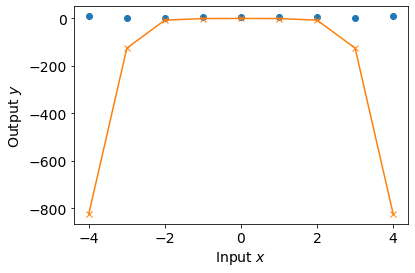

In [40]:
train (xnd, ynd, model, lossFunc, 10000, 1e-7)  # run this cell many times using Ctrl-Enter
Ynd = predict (xnd, model)
compare (xnd, ynd, Ynd)

### Attempt 2
Rescale the parameters C and D so that the model function is now $y = A + Bx^2 + 0.01Cx^4 + 0.0001Dx^6$.  We can now train the NN with a much higher learning rate of 1e-2.  We get a good fit already after 10000 epochs!

In [41]:
class Model(nn.Module):
    def __init__(self):
        super(Model, self).__init__()
        self.lin1 = nn.Linear(1,1,bias=True)        
        self.lin2 = nn.Linear(1,1,bias=False)        
        self.lin3 = nn.Linear(1,1,bias=False)        
    def forward(self, x):
        return self.lin1(x**2) + self.lin2(0.01*x**4) + self.lin3(0.0001*x**6)
model = Model()
lossFunc  = nn.MSELoss()

Training epoch 0/10000  	 Loss = 13.2727
Training epoch 1000/10000  	 Loss = 0.5155
Training epoch 1370/10000  	 Loss = 0.3594
Change is smaller than tolerance; terminating loop.


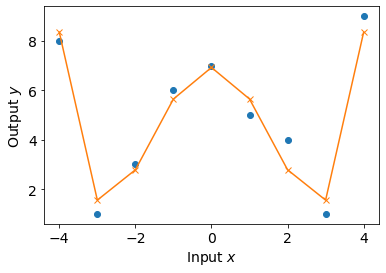

In [42]:
train (xnd, ynd, model, lossFunc, 10000, 1e-2)  # run this cell many times using Ctrl-Enter
Ynd = predict (xnd, model)
compare (xnd, ynd, Ynd)

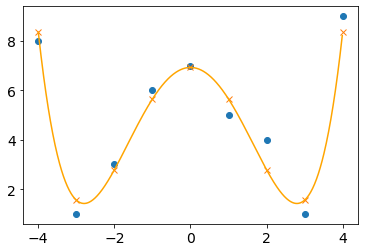

In [43]:
#-------- Plot the model for finely spaced input values
xndFine = torch.reshape (torch.arange(-4., 4., .01), (-1,1))
YndFine = model(xndFine).detach()   # evaluate model for finely spaced inputs
Ynd = model(xnd).detach()   # evaluate model for finely spaced inputs
plt.plot (xnd,ynd,'o')
plt.plot (xnd,Ynd,'x')
plt.plot (xndFine,YndFine,'-',color='orange')

### Attempt 3
Let us implement the sextic function a different way.  Extract features $f_1=x^2$, $f_2=x^4$, $f_3=x^6$, and fit to linear model $y = b + w_1 f_1 + w_2 f_2 + w_3 f_3$.  

We have the same problem as in Attempt 1.  The feature space is a 16 x 256 x 4096 cuboid, which is very anisotropic, and the learning rate is limited by the most sensitive direction.

In [44]:
fnd = torch.hstack ((xnd**2,xnd**4,xnd**6))  # 9 feature vectors, each of size 3
model    = nn.Linear(3,1)
lossFunc = nn.MSELoss()
torch.set_printoptions(precision=0, threshold=None, edgeitems=None, linewidth=None, profile=None, sci_mode=False)
print (fnd)

tensor([[  16.,  256., 4096.],
        [   9.,   81.,  729.],
        [   4.,   16.,   64.],
        [   1.,    1.,    1.],
        [   0.,    0.,    0.],
        [   1.,    1.,    1.],
        [   4.,   16.,   64.],
        [   9.,   81.,  729.],
        [  16.,  256., 4096.]])


Training epoch 0/10000  	 Loss = 76249.3125
Training epoch 1000/10000  	 Loss = 76129.2266
Training epoch 2000/10000  	 Loss = 76009.2578
Training epoch 3000/10000  	 Loss = 75889.3672
Training epoch 4000/10000  	 Loss = 75769.5781
Training epoch 5000/10000  	 Loss = 75649.8906
Training epoch 6000/10000  	 Loss = 75530.2734
Training epoch 7000/10000  	 Loss = 75410.7656
Training epoch 8000/10000  	 Loss = 75291.3594
Training epoch 9000/10000  	 Loss = 75172.0391



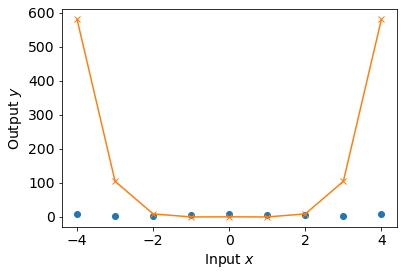

In [45]:
train (fnd, ynd, model, lossFunc, 10000, 1e-7)  # train model on features fnd
Ynd = predict (fnd, model)                      # use model to preduct based on features fnd
compare (xnd, ynd, Ynd)

### Attempt 4: Manual feature extraction, automatic feature normalization
PyTorch handle it.  Add a "batch normalization" layer before the "Linear" layer.  This rescales the features.  Maybe this rescales the features into the interval [-1,+1].  Or maybe this rescales the features so that their mean is 0 and their standard deviation is 1.  I don't know how to see what goes on under the hood.  

Anyway, this does the trick!  Now we can train with a much faster learning rate of 1e-2.  A good fit is obtained after 10000 epochs.

In [46]:
fnd      = torch.hstack ((xnd**2,xnd**4,xnd**6))  # 9 feature vectors, each of size 3
model    = nn.Sequential (nn.BatchNorm1d(3), nn.Linear(3,1))
lossFunc = nn.MSELoss()

Training epoch 0/10000  	 Loss = 29.6461
Training epoch 355/10000  	 Loss = 0.2276
Change is smaller than tolerance; terminating loop.


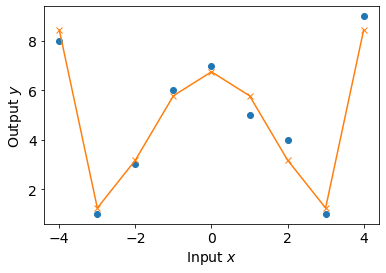

In [47]:
train (fnd, ynd, model, lossFunc, 10000, 1e-2)  # train model on features fnd
Ynd = predict (fnd, model)                    # use model to preduct based on features fnd
compare (xnd, ynd, Ynd)

In [48]:
torch.set_printoptions(precision=2, threshold=None, edgeitems=None, linewidth=None, profile=None, sci_mode=False)
theBatchNormLayer = model[0]
print ("Original features f_1, f_2, f_3:\n", fnd)
print ("Normalized features F_1, F_2, F_3:\n", theBatchNormLayer(fnd))

Original features f_1, f_2, f_3:
 tensor([[     16.,     256.,    4096.],
        [      9.,      81.,     729.],
        [      4.,      16.,      64.],
        [      1.,       1.,       1.],
        [      0.,       0.,       0.],
        [      1.,       1.,       1.],
        [      4.,      16.,      64.],
        [      9.,      81.,     729.],
        [     16.,     256.,    4096.]])
Normalized features F_1, F_2, F_3:
 tensor([[ 5.09, -1.83,  6.65],
        [ 0.63, -0.85,  0.20],
        [-2.56, -0.48, -1.07],
        [-4.47, -0.39, -1.19],
        [-5.11, -0.39, -1.19],
        [-4.47, -0.39, -1.19],
        [-2.56, -0.48, -1.07],
        [ 0.63, -0.85,  0.20],
        [ 5.09, -1.83,  6.65]], grad_fn=<NativeBatchNormBackward0>)


### Attempt 5: Manual normalization
Let's take a more hands-on approach and do the normalization ourselves.  Compute the feature mean and feature standard deviation as follows:  
    $\langle f_d \rangle = \frac{1}{N} \sum_{n=1}^N f_{nd}$  
    $\langle {f_d}^2 \rangle = \frac{1}{N} \sum_{n=1}^N (f_{nd})^2$  
    $\mu_d = \langle f_d \rangle$  
    $\sigma_d = \sqrt{\frac{N}{N-1}} \sqrt{  \langle {f_d}^2 \rangle - \langle f_d \rangle^2  }$. 

In [49]:
fnd = torch.hstack ((xnd**2,xnd**4,xnd**6))  #N= 9 feature vectors, each of size D=3
fdMean = torch.mean (fnd, 0)  # compute the means along dimension 0, i.e., average over n=0,...,N-1
fdSigma = torch.var (fnd, 0, True)**0.5  # compute the standard deviations along dimension 0
torch.set_printoptions(precision=1,sci_mode=False)
print ("Original feature vectors f_{nd}=\n",fnd)
print ("Mean[f_d] =", fdMean)
print ("Sdev[f_d]  =", fdSigma)

Original feature vectors f_{nd}=
 tensor([[    16.,    256.,   4096.],
        [     9.,     81.,    729.],
        [     4.,     16.,     64.],
        [     1.,      1.,      1.],
        [     0.,      0.,      0.],
        [     1.,      1.,      1.],
        [     4.,     16.,     64.],
        [     9.,     81.,    729.],
        [    16.,    256.,   4096.]])
Mean[f_d] = tensor([   6.7,   78.7, 1086.7])
Sdev[f_d]  = tensor([   6.2,  105.5, 1732.0])


We see that the three features $f_1$, $f_2$, $f_3$ have very different spreads of values.  To fix this, apply the normalizing transformation
    $F_{nd} = (f_{nd} - \mu_d)/\sigma_d$.  
Verify that the normalized features indeed have mean 0 and standard deivation 1:

In [50]:
Fnd = (fnd - fdMean)/fdSigma
FdMean = torch.mean (Fnd, 0)
FdSigma = torch.var (Fnd, 0, True)**0.5
print ("Normalized feature vectors F_{nd}=\n",Fnd)
print ("Mean[F_d] =", FdMean)
print ("Sdev[F_d]  =", FdSigma)

Normalized feature vectors F_{nd}=
 tensor([[ 1.5,  1.7,  1.7],
        [ 0.4,  0.0, -0.2],
        [-0.4, -0.6, -0.6],
        [-0.9, -0.7, -0.6],
        [-1.1, -0.7, -0.6],
        [-0.9, -0.7, -0.6],
        [-0.4, -0.6, -0.6],
        [ 0.4,  0.0, -0.2],
        [ 1.5,  1.7,  1.7]])
Mean[F_d] = tensor([    0.0,     0.0,     0.0])
Sdev[F_d]  = tensor([1., 1., 1.])


Now we are ready to do the fitting!

In [51]:
model    = nn.Linear(3,1)
lossFunc = nn.MSELoss()

Training epoch 0/10000  	 Loss = 29.0884
Training epoch 1000/10000  	 Loss = 0.2855
Training epoch 1139/10000  	 Loss = 0.2584
Change is smaller than tolerance; terminating loop.


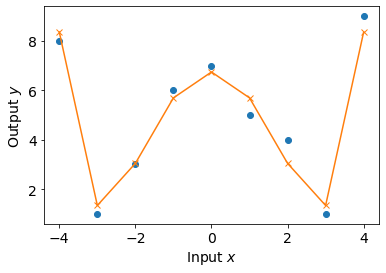

In [52]:
train (Fnd, ynd, model, lossFunc, 10000, 1e-2)  # tra4n model on features fnd
Ynd = predict (Fnd, model)                    # use model to preduct based on features fnd
compare (xnd, ynd, Ynd)